In [241]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np

In [242]:
from pathlib import Path
path = Path('../data_inputs_temp/')

In [243]:
ficheros = ['entropy-shuffle', 'blosclz-shuffle-split', 'zstd-shuffle-nosplit']

ficheros_path = [str(path) + '/' + fichero + '.csv.gz' for fichero in ficheros]
dataframes1 = {}
nsplits = [55296] * 2 + [13824]

for i in range(0, len(ficheros)):
    dataframes1[ficheros[i]] = pd.read_csv(ficheros_path[i], delimiter=',')
    codec_filter = np.repeat(ficheros[i], nsplits[i])
    dataframes1[ficheros[i]]['codec_filter'] = codec_filter
    if i == 0:
        categoria = np.repeat(str(30+i), nsplits[i])
    else:
        categoria = np.repeat(str(i-1), nsplits[i])
    dataframes1[ficheros[i]]['categoria'] = categoria
    
    dataframes1[ficheros[i]].rename(columns = {'cratio':'cratio', ' speed':'speed', ' special_vals':'special_vals', ' nchunk':'nchunk', ' category':'category'}, inplace = True)

In [244]:
from pathlib import Path
path = Path('../data_inputs')

In [245]:
ficheros = ['entropy-shuffle', 'blosclz-shuffle-split', 'zstd-shuffle-nosplit']

ficheros_path = [str(path) + '/' + fichero + '.csv.gz' for fichero in ficheros]
dataframes2 = {}
nsplits = [55296] * 2 + [13824]

for i in range(0, len(ficheros)):
    dataframes2[ficheros[i]] = pd.read_csv(ficheros_path[i], delimiter=',')
    codec_filter = np.repeat(ficheros[i], nsplits[i])
    dataframes2[ficheros[i]]['codec_filter'] = codec_filter
    if i == 0:
        categoria = np.repeat(str(30+i), nsplits[i])
    else:
        categoria = np.repeat(str(i-1), nsplits[i])
    dataframes2[ficheros[i]]['categoria'] = categoria
    
    dataframes2[ficheros[i]].rename(columns = {'cratio':'cratio', ' speed':'speed', ' special_vals':'special_vals', ' nchunk':'nchunk', ' category':'category'}, inplace = True)

In [246]:
from pathlib import Path
path = Path('../data_inputs_wind/')

In [247]:
ficheros = ['entropy-shuffle', 'blosclz-shuffle-split', 'zstd-shuffle-nosplit']

ficheros_path = [str(path) + '/' + fichero + '.csv.gz' for fichero in ficheros]
dataframes3 = {}
nsplits = [55296] * 2 + [13824]

for i in range(0, len(ficheros)):
    dataframes3[ficheros[i]] = pd.read_csv(ficheros_path[i], delimiter=',')
    codec_filter = np.repeat(ficheros[i], nsplits[i])
    dataframes3[ficheros[i]]['codec_filter'] = codec_filter
    if i == 0:
        categoria = np.repeat(str(30+i), nsplits[i])
    else:
        categoria = np.repeat(str(i-1), nsplits[i])
    dataframes3[ficheros[i]]['categoria'] = categoria
    
    dataframes3[ficheros[i]].rename(columns = {'cratio':'cratio', ' speed':'speed', ' special_vals':'special_vals', ' nchunk':'nchunk', ' category':'category'}, inplace = True)

In [248]:
55296/13824

4.0

In [249]:
dataframes1[ficheros[2]] = dataframes1[ficheros[2]].loc[np.repeat(dataframes1[ficheros[2]].index.values, 4)]
dataframes1[ficheros[2]].reset_index(drop=True)

dataframes2[ficheros[2]] = dataframes2[ficheros[2]].loc[np.repeat(dataframes2[ficheros[2]].index.values, 4)]
dataframes2[ficheros[2]].reset_index(drop=True)

dataframes3[ficheros[2]] = dataframes3[ficheros[2]].loc[np.repeat(dataframes3[ficheros[2]].index.values, 4)]
dataframes3[ficheros[2]].reset_index(drop=True)

,cratio,speed,special_vals,nchunk,category,codec_filter,categoria
0,10.5,1.620000e+07,0,0,28,zstd-shuffle-nosplit,1
1,10.5,1.620000e+07,0,0,28,zstd-shuffle-nosplit,1
2,10.5,1.620000e+07,0,0,28,zstd-shuffle-nosplit,1
3,10.5,1.620000e+07,0,0,28,zstd-shuffle-nosplit,1
4,10.8,1.610000e+07,0,0,28,zstd-shuffle-nosplit,1
...,...,...,...,...,...,...,...
55291,65500.0,6.210000e+09,1,215,28,zstd-shuffle-nosplit,1
55292,65500.0,6.200000e+09,1,215,28,zstd-shuffle-nosplit,1
55293,65500.0,6.200000e+09,1,215,28,zstd-shuffle-nosplit,1
55294,65500.0,6.200000e+09,1,215,28,zstd-shuffle-nosplit,1


In [250]:
df_fig = pd.DataFrame()
for i in range(0, len(ficheros)):
    df_fig = pd.concat([df_fig, dataframes1[ficheros[i]], 
                        dataframes2[ficheros[i]], dataframes3[ficheros[i]]], axis = 0)

In [251]:
df_fig = df_fig[df_fig['special_vals'] == 0]

In [252]:
fig = px.scatter(df_fig, "cratio", "speed", color = "categoria")
fig.show()

0: blosclz-split

1: zstd-nosplit

30: entropy

# Dataframe filter: SHUFFLE

In [253]:
df_entropy = pd.DataFrame()
df_entropy = pd.concat([df_entropy, dataframes1[ficheros[0]], dataframes2[ficheros[0]], 
                       dataframes3[ficheros[0]]], axis = 0)

df_entropy.rename(columns = {'cratio':'cratio31', 'speed':'speed31', 'special_vals':'special_vals31'}, inplace = True)
df_entropy = df_entropy.drop(['nchunk', 'category', 'codec_filter', 'categoria'], axis = 1)

df_entropy = df_entropy.reset_index(drop=True)

In [254]:
df_blosclz = pd.DataFrame()
df_blosclz = pd.concat([df_blosclz, dataframes1[ficheros[1]], dataframes2[ficheros[1]], 
                       dataframes3[ficheros[1]]], axis = 0)

df_blosclz.rename(columns = {'cratio':'cratio0', 'speed':'speed0', 'special_vals':'special_vals0'}, inplace = True)
df_blosclz = df_blosclz.drop(['nchunk', 'category', 'codec_filter', 'categoria'], axis = 1)

df_blosclz = df_blosclz.reset_index(drop=True)

In [255]:
df_zstd = pd.DataFrame()
df_zstd = pd.concat([df_zstd, dataframes1[ficheros[2]], dataframes2[ficheros[2]], 
                        dataframes3[ficheros[2]]], axis = 0)

df_zstd.rename(columns = {'cratio':'cratio1', 'speed':'speed1', 'special_vals':'special_vals1'}, inplace = True)
df_zstd = df_zstd.drop(['nchunk', 'category', 'codec_filter', 'categoria'], axis = 1)

df_zstd = df_zstd.reset_index(drop=True)

In [256]:
df_shuffle = pd.DataFrame()
df_shuffle = pd.concat([df_shuffle, df_blosclz, df_zstd, df_entropy], axis = 1)

Eliminar special_value (que lo sea en alguna de las 3 categorías)

In [257]:
def delete_final(special_vals0, special_vals1, special_vals31):
    if (special_vals0 == 1 or special_vals1 == 1 or special_vals31 == 1):
        return 1
    else:
        return 0

In [258]:
df_shuffle["delete_f"] = df_shuffle.apply(lambda x: delete_final(x[2], x[5], x[8]), axis=1)

In [259]:
df_shuffle = df_shuffle[df_shuffle['delete_f'] == 0]

In [260]:
df_shuffle = df_shuffle.drop(['delete_f'], axis = 1)

In [261]:
df_input_x = df_shuffle.iloc[:, [6, 7]]

Cálculo del SCORE

In [262]:
df_shuffle = df_shuffle.drop(['cratio31', 'speed31', 'special_vals31', 'special_vals0', 'special_vals1'], axis = 1)

In [263]:
dfcratios = pd.DataFrame()
for i in range(0, 2):
    dfcratios = pd.concat([dfcratios, df_shuffle.iloc[:, 2*i]], axis =0)

In [264]:
desv_cratio = dfcratios.std()[0]
desv_cratio

178.1298988481504

In [265]:
mean_cratio = dfcratios.mean()[0]
mean_cratio

30.312790118703887

In [266]:
dfspeeds = pd.DataFrame()
for i in range(0, 2):
    dfspeeds = pd.concat([dfspeeds, df_shuffle.iloc[:, 2*i+1]], axis =0)

In [267]:
mean_speed = dfspeeds.mean()[0]
mean_speed

591009109.5283927

In [268]:
desv_speed = dfspeeds.std()[0]
desv_speed

1070917778.8250005

In [269]:
theta = 0.5

cratio0 = df_shuffle["cratio0"]
speed0 = df_shuffle["speed0"]
ncratio0 = (cratio0 - mean_cratio) / desv_cratio
nspeed0 = (speed0 - mean_speed) / desv_speed
df_shuffle.insert(2, 0, theta*ncratio0 + (1-theta)*nspeed0)

cratio1 = df_shuffle["cratio1"]
speed1 = df_shuffle["speed1"]
ncratio1 = (cratio1 - mean_cratio) / desv_cratio
nspeed1 = (speed1 - mean_speed) / desv_speed
df_shuffle.insert(5, 1, theta*ncratio1 + (1-theta)*nspeed1)

In [270]:
df_pos = df_shuffle
df_pos = df_pos.drop(['cratio0', 'speed0', 'cratio1', 'speed1'], axis = 1)

In [271]:
best_categ_shuffle = df_pos.idxmax(axis=1)
best_categ_shuffle = pd.DataFrame(best_categ_shuffle, columns=['best_categ'])

In [272]:
categorias = best_categ_shuffle['best_categ'].unique()

In [273]:
unique, counts = np.unique(best_categ_shuffle, return_counts=True)
result = np.column_stack((unique, counts))
result

array([[    0, 76935],
       [    1,   990]])

In [274]:
df_t = pd.DataFrame()
df_t = pd.concat([df_t, df_input_x['cratio31']], axis = 1)
df_t = pd.concat([df_t, df_input_x['speed31']], axis = 1)
df_t = pd.concat([df_t, best_categ_shuffle], axis = 1)

Balancear

In [275]:
df_blc = pd.DataFrame()
for i in categorias:
    df_i = df_t[df_t['best_categ'] == i]
    df_i = df_i.head(n=990)
    df_blc = pd.concat([df_blc, df_i], axis = 0)

In [276]:
dfinput_y = pd.DataFrame()
dfinput_y = pd.concat([dfinput_y, df_blc['best_categ']], axis = 1)
dfinput_y.shape

(1980, 1)

In [277]:
dfinput_x = df_blc.drop(['best_categ'], axis = 1)
dfinput_x.shape

(1980, 2)

Normalizar inputs

In [278]:
dfcratios = pd.DataFrame()
dfcratios = pd.concat([dfcratios, dfinput_x.iloc[:, 0]], axis =0)

In [279]:
desv_cratio = dfcratios.std()[0]
desv_cratio

68.70255230839582

In [280]:
mean_cratio = dfcratios.mean()[0]
mean_cratio

65.30538383838385

In [281]:
dfspeeds = pd.DataFrame()
dfspeeds = pd.concat([dfspeeds, dfinput_x.iloc[:, 1]], axis =0)

In [282]:
mean_speed = dfspeeds.mean()[0]
mean_speed

10349929292.929293

In [283]:
desv_speed = dfspeeds.std()[0]
desv_speed

7743782150.603708

In [284]:
cratio = dfinput_x["cratio31"]
speed = dfinput_x["speed31"]
ncratio = (cratio - mean_cratio) / desv_cratio
nspeed = (speed - mean_speed) / desv_speed

dfinput_x_norm = pd.DataFrame()
dfinput_x_norm.insert(0, "ncratio", ncratio)
dfinput_x_norm.insert(1, "nspeed", nspeed)

In [285]:
dfinput_x = dfinput_x_norm

In [286]:
dfinput_x.shape

(1980, 2)

In [287]:
dfinput_y.shape

(1980, 1)

# RED NEURONAL (2 categorías)

In [288]:
from sklearn.model_selection import train_test_split

# Split the data
x_train, x_test, y_train, y_test = train_test_split(dfinput_x, dfinput_y, test_size=0.1, shuffle= True)

In [289]:
x_train.shape

(1782, 2)

In [290]:
x_test.shape

(198, 2)

In [291]:
y_test_nocod = y_test.copy()

In [292]:
from keras.utils import to_categorical
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

In [293]:
from keras import models, layers
import tensorflow

tensorflow.random.set_seed(100)

model = models.Sequential()
model.add(layers.Dense(2, activation='relu', input_shape=(2,)))
model.add(layers.Dense(2, activation='relu'))
model.add(layers.Dense(2, activation='softmax'))

In [294]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['acc'])

In [295]:
history = model.fit(x_train, y_train, epochs = 50, validation_data = (x_test, y_test))

Epoch 1/50
56/56 [==============================] - 0s 2ms/step - loss: 0.5953 - acc: 0.5009 - val_loss: 0.5726 - val_acc: 0.9697
Epoch 2/50
56/56 [==============================] - 0s 825us/step - loss: 0.5321 - acc: 0.9849 - val_loss: 0.5150 - val_acc: 0.9697
Epoch 3/50
56/56 [==============================] - 0s 774us/step - loss: 0.4735 - acc: 0.9872 - val_loss: 0.4604 - val_acc: 0.9697
Epoch 4/50
56/56 [==============================] - 0s 825us/step - loss: 0.4214 - acc: 0.9793 - val_loss: 0.4077 - val_acc: 0.9697
Epoch 5/50
56/56 [==============================] - 0s 862us/step - loss: 0.3663 - acc: 0.9859 - val_loss: 0.3607 - val_acc: 0.9697
Epoch 6/50
56/56 [==============================] - 0s 859us/step - loss: 0.3114 - acc: 0.9791 - val_loss: 0.3219 - val_acc: 0.9697
Epoch 7/50
56/56 [==============================] - 0s 875us/step - loss: 0.2742 - acc: 0.9846 - val_loss: 0.2902 - val_acc: 0.9697
Epoch 8/50
56/56 [==============================] - 0s 880us/step - loss: 0.24

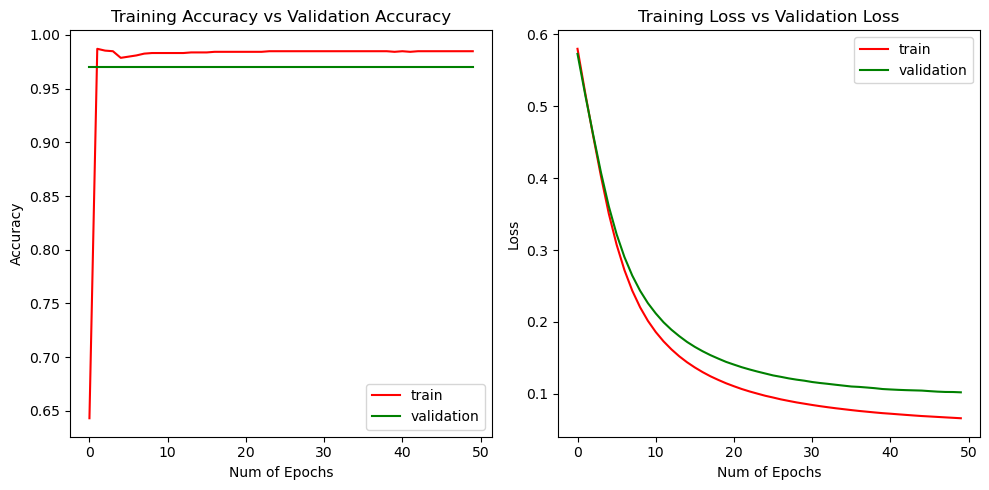

In [296]:
_, ax = plt.subplots(1, 2, figsize=(10, 5), dpi=100)
ax[0].plot(history.history['acc'], 'r')
ax[0].plot(history.history['val_acc'], 'g')
ax[0].set_xlabel("Num of Epochs")
ax[0].set_ylabel("Accuracy")
ax[0].set_title("Training Accuracy vs Validation Accuracy")
ax[0].legend(['train', 'validation'])

ax[1].plot(history.history['loss'], 'r')
ax[1].plot(history.history['val_loss'], 'g')
ax[1].set_xlabel("Num of Epochs")
ax[1].set_ylabel("Loss")
ax[1].set_title("Training Loss vs Validation Loss")
ax[1].legend(['train', 'validation'])

plt.tight_layout()

In [297]:
y_hat = model.predict(x=x_test)

In [298]:
y_pred_label = np.argmax(y_hat, axis = 1)
y_true_label = np.argmax(y_test, axis = 1)

In [299]:
unique, counts = np.unique(y_pred_label, return_counts=True)
result = np.column_stack((unique, counts))
result

array([[  0, 109],
       [  1,  89]])

In [300]:
unique, counts = np.unique(y_true_label, return_counts=True)
result = np.column_stack((unique, counts))
result

array([[  0, 109],
       [  1,  89]])

In [301]:
tabla = pd.crosstab(y_pred_label, y_true_label)
tabla

col_0,0,1
row_0,,
0,106,3
1,3,86


# Análisis resultados

In [302]:
df_correctos = pd.DataFrame(columns=['cratio', 'speed', 'category'])

In [303]:
for i in range (0, len(y_pred_label)):
    cratio_act = x_test.iloc[i, 0]
    speed_act = x_test.iloc[i, 1]
    categ_act = y_test_nocod.iloc[i, 0]
    
    df_correctos = df_correctos.append({'cratio': cratio_act, 'speed': speed_act, 'category': categ_act}, ignore_index=True)
    

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/1526488092.py:6: FutureWarning:

The frame.append method is depreca

In [304]:
fig = px.scatter(df_correctos, "cratio", "speed", color = "category")
fig.show()

GRÁFICAS POR CATEGORÍA (Y SU ERROR)

In [305]:
df_0 = pd.DataFrame(columns=['cratio', 'speed', 'category'])

In [306]:
for i in range (0, len(y_pred_label)):
    cratio_act = x_test.iloc[i, 0]
    speed_act = x_test.iloc[i, 1]
    categ_act = y_test_nocod.iloc[i, 0]
    if y_pred_label[i] == y_true_label[i] and y_pred_label[i] == 0.0:
        df_0 = df_0.append({'cratio': cratio_act, 'speed': speed_act, 'category': 0}, ignore_index=True)

for i in range (0, len(y_pred_label)):
    cratio_act = x_test.iloc[i, 0]
    speed_act = x_test.iloc[i, 1]
    if y_pred_label[i] != y_true_label[i] and y_true_label[i] == 0.0:
        df_0 = df_0.append({'cratio': cratio_act, 'speed': speed_act, 'category': -1}, ignore_index=True)

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/231471944.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/231471944.py:6: FutureWarning:

The frame.append method is deprecated a

In [307]:
fig = px.scatter(df_0, "cratio", "speed", color = "category")
fig.show()

In [308]:
df_1 = pd.DataFrame(columns=['cratio', 'speed', 'category'])

In [309]:
for i in range (0, len(y_pred_label)):
    cratio_act = x_test.iloc[i, 0]
    speed_act = x_test.iloc[i, 1]
    categ_act = y_test_nocod.iloc[i, 0]
    if y_pred_label[i] == y_true_label[i] and y_pred_label[i] == 1.0:
        df_1 = df_1.append({'cratio': cratio_act, 'speed': speed_act, 'category': 1}, ignore_index=True)

for i in range (0, len(y_pred_label)):
    cratio_act = x_test.iloc[i, 0]
    speed_act = x_test.iloc[i, 1]
    if y_pred_label[i] != y_true_label[i] and y_true_label[i] == 1.0:
        df_1 = df_1.append({'cratio': cratio_act, 'speed': speed_act, 'category': -2}, ignore_index=True)

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/3336450026.py:6: FutureWarning:

The frame.append method is depreca

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/3336450026.py:6: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/h2/jqn84kqj7nb1x9kf75kyj3nh0000gq/T/ipykernel_31417/3336450026.py:6: FutureWarning:

The frame.append method is depreca

In [310]:
fig = px.scatter(df_1, "cratio", "speed", color = "category")
fig.show()